# Customer Personality Analysis
### Clustering Proyect

David Santiago Buitrago Prada

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Data Load

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("imakash3011/customer-personality-analysis")

print("Path to dataset files:", path)

df = pd.read_csv(path + '/marketing_campaign.csv', sep = '\t')
df = df.drop('ID', axis=1)
df.head()

Using Colab cache for faster access to the 'customer-personality-analysis' dataset.
Path to dataset files: /kaggle/input/customer-personality-analysis


,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,...,7,0,0,0,0,0,0,3,11,1
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,...,5,0,0,0,0,0,0,3,11,0
2,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,...,4,0,0,0,0,0,0,3,11,0
3,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,...,6,0,0,0,0,0,0,3,11,0
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,...,5,0,0,0,0,0,0,3,11,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2240 non-null   int64  
 1   Education            2240 non-null   object 
 2   Marital_Status       2240 non-null   object 
 3   Income               2216 non-null   float64
 4   Kidhome              2240 non-null   int64  
 5   Teenhome             2240 non-null   int64  
 6   Dt_Customer          2240 non-null   object 
 7   Recency              2240 non-null   int64  
 8   MntWines             2240 non-null   int64  
 9   MntFruits            2240 non-null   int64  
 10  MntMeatProducts      2240 non-null   int64  
 11  MntFishProducts      2240 non-null   int64  
 12  MntSweetProducts     2240 non-null   int64  
 13  MntGoldProds         2240 non-null   int64  
 14  NumDealsPurchases    2240 non-null   int64  
 15  NumWebPurchases      2240 non-null   i

## Handling with null registers

In [ ]:
df[df['Income'].isnull()]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
10,1983,Graduation,Married,NaN,1,0,15-11-2013,11,5,5,...,7,0,0,0,0,0,0,3,11,0
27,1986,Graduation,Single,NaN,1,0,20-02-2013,19,5,1,...,1,0,0,0,0,0,0,3,11,0
43,1959,PhD,Single,NaN,0,0,05-11-2013,80,81,11,...,2,0,0,0,0,0,0,3,11,0
48,1951,Graduation,Single,NaN,2,1,01-01-2014,96,48,5,...,6,0,0,0,0,0,0,3,11,0
58,1982,Graduation,Single,NaN,1,0,17-06-2013,57,11,3,...,6,0,0,0,0,0,0,3,11,0
71,1973,2n Cycle,Married,NaN,1,0,14-09-2012,25,25,3,...,8,0,0,0,0,0,0,3,11,0
90,1957,PhD,Married,NaN,2,1,19-11-2012,4,230,42,...,9,0,0,0,0,0,0,3,11,0
91,1957,Graduation,Single,NaN,1,1,27-05-2014,45,7,0,...,7,0,0,0,0,0,0,3,11,0
92,1973,Master,Together,NaN,0,0,23-11-2013,87,445,37,...,1,0,0,0,0,0,0,3,11,0
128,1961,PhD,Married,NaN,0,1,11-07-2013,23,352,0,...,6,0,0,0,0,0,0,3,11,0


In [ ]:
df['Income'] = df['Income'].fillna(df['Income'].mean())

In [ ]:
df[df.duplicated()]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
83,1963,Master,Together,38620.0,0,0,11-05-2013,56,112,17,...,3,0,0,0,0,0,0,3,11,0
179,1951,2n Cycle,Married,78497.0,0,0,01-12-2013,44,207,26,...,2,0,0,0,1,0,0,3,11,0
281,1976,Graduation,Together,51369.0,0,1,25-10-2012,84,297,7,...,8,0,0,0,0,0,0,3,11,0
282,1946,Graduation,Together,37760.0,0,0,31-08-2012,20,84,5,...,7,0,0,0,0,0,0,3,11,0
363,1978,PhD,Married,37717.0,1,0,23-11-2012,31,9,0,...,9,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2218,1978,Graduation,Together,22775.0,1,0,19-06-2013,40,5,1,...,8,0,0,0,0,0,0,3,11,0
2221,1982,Master,Single,75777.0,0,0,04-07-2013,12,712,26,...,1,0,1,1,0,0,0,3,11,1
2225,1968,Graduation,Together,58554.0,1,1,26-09-2012,55,368,24,...,7,0,0,0,0,0,0,3,11,0
2234,1974,Graduation,Married,34421.0,1,0,01-07-2013,81,3,3,...,7,0,0,0,0,0,0,3,11,0


## EDA

In [ ]:
numeric_cols = df.select_dtypes(include=['number']).columns
numeric_cols = numeric_cols.drop(['Year_Birth', 'Kidhome', 'Teenhome','Z_CostContact', 'Z_Revenue', 'AcceptedCmp3',  'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response'])
numeric_cols

Index(['Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth'],
      dtype='object')

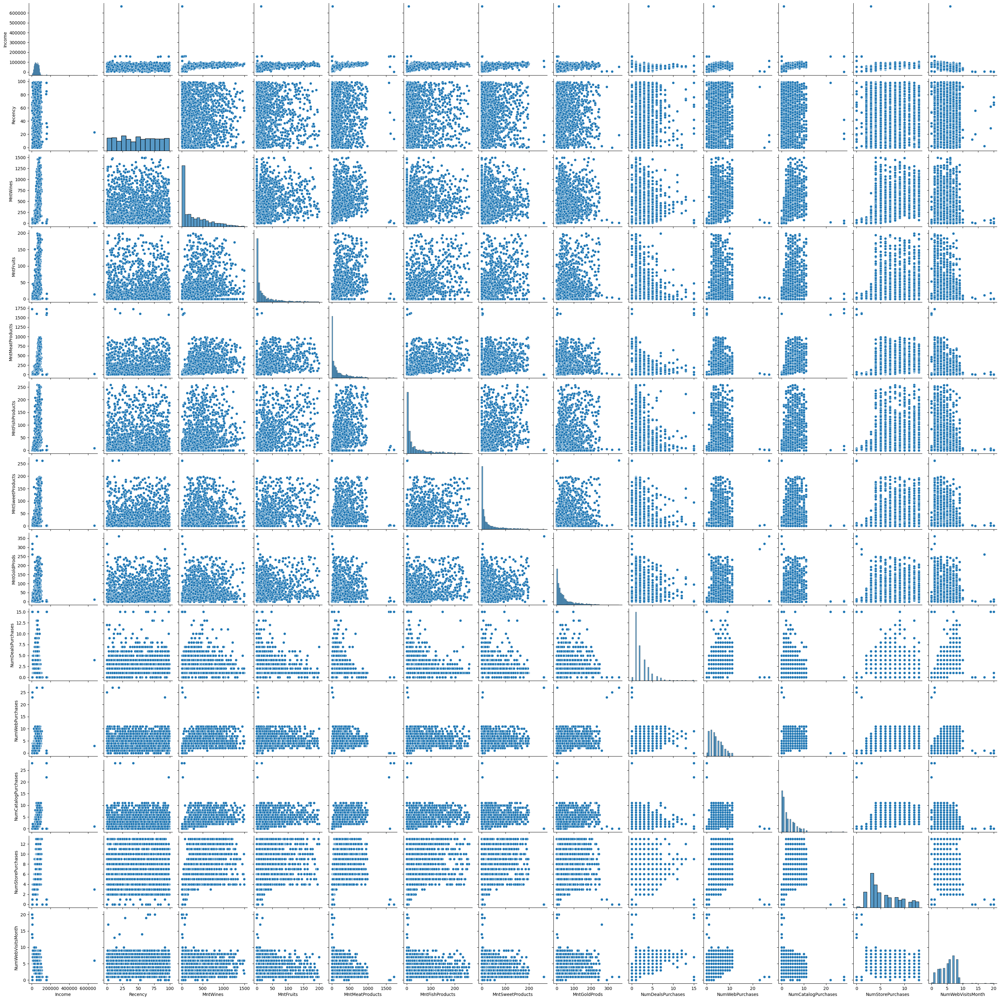

In [ ]:
sns.pairplot(df[numeric_cols])
plt.show()

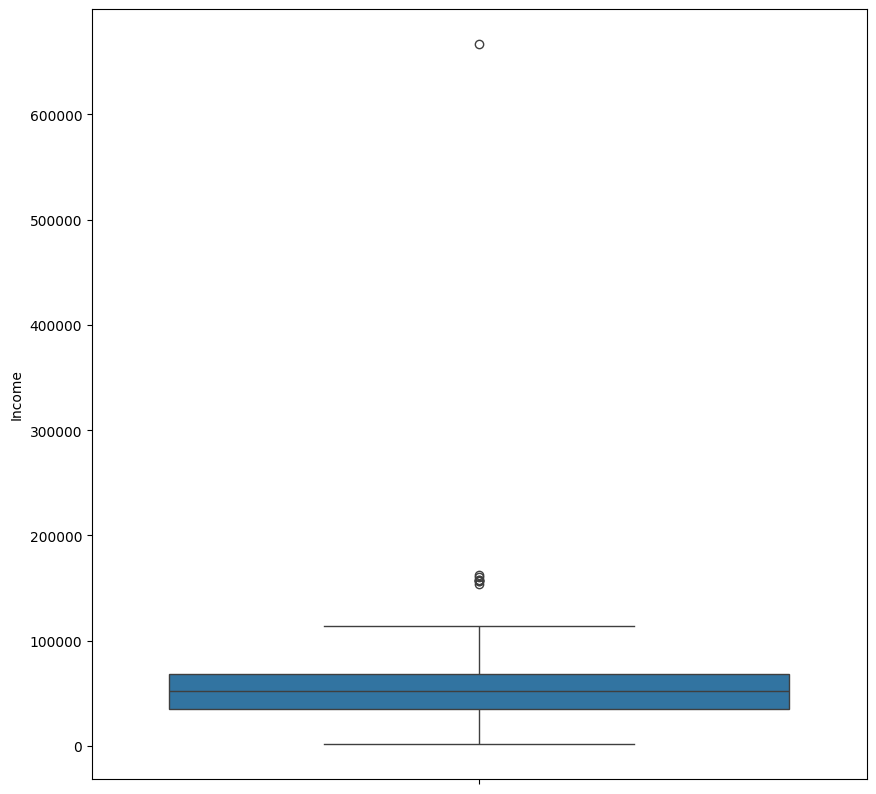

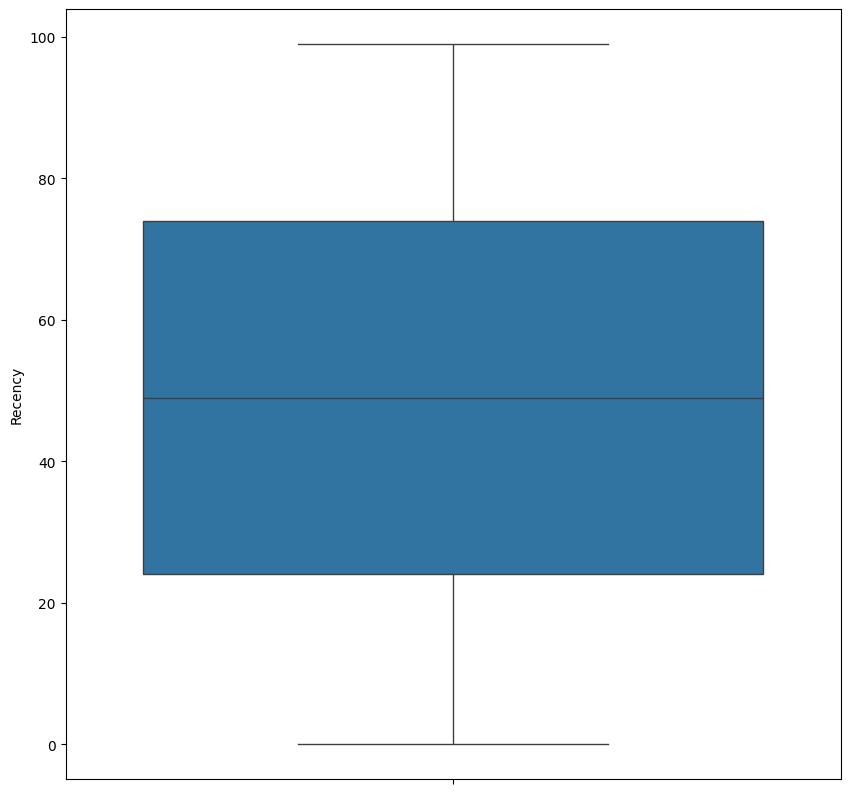

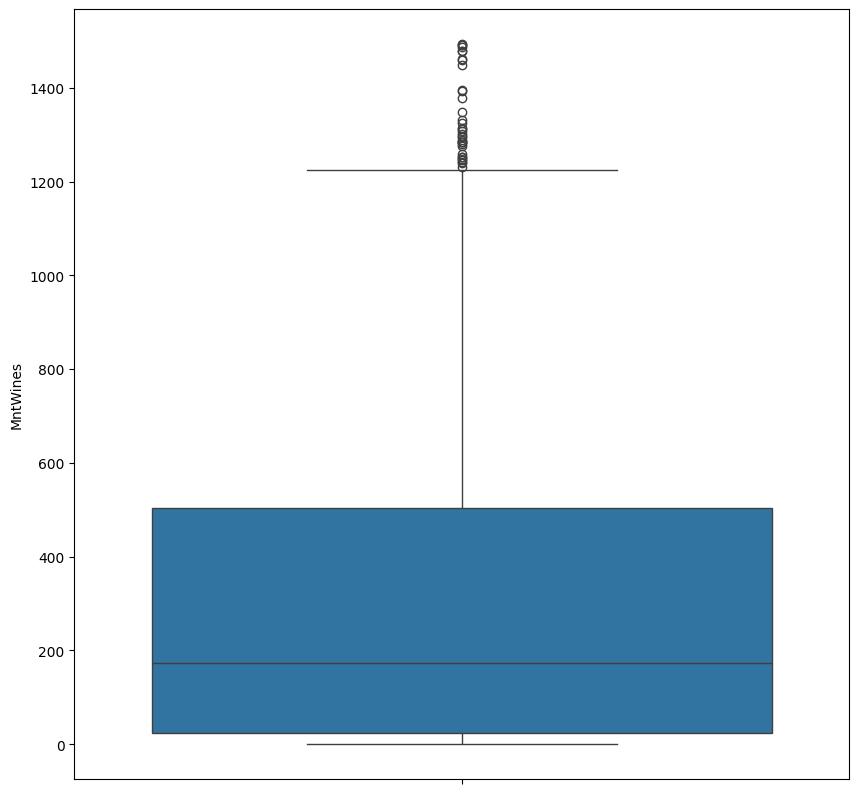

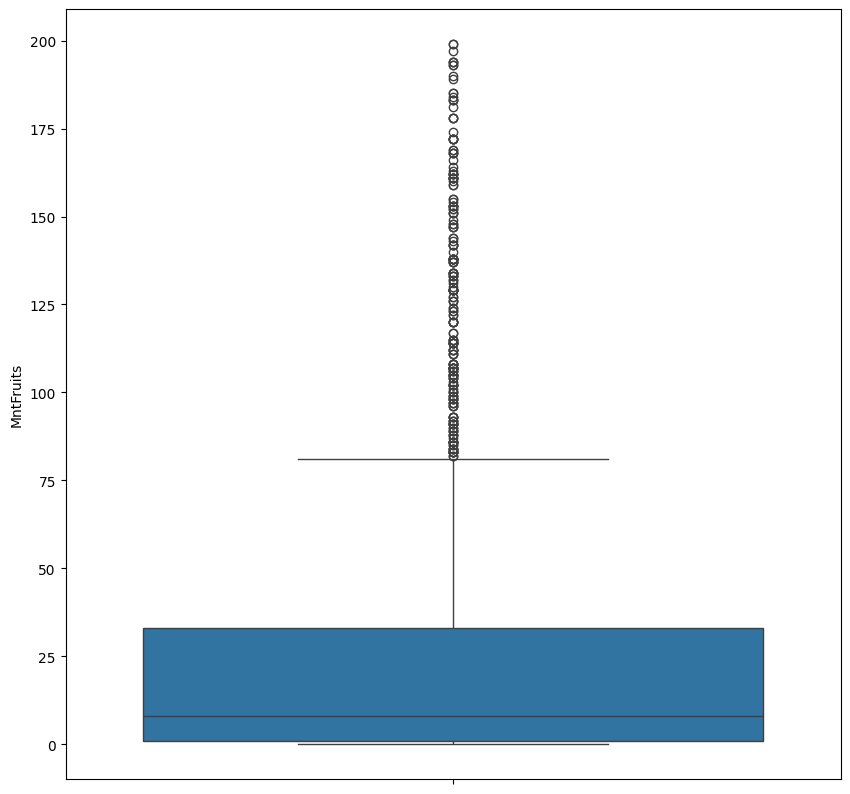

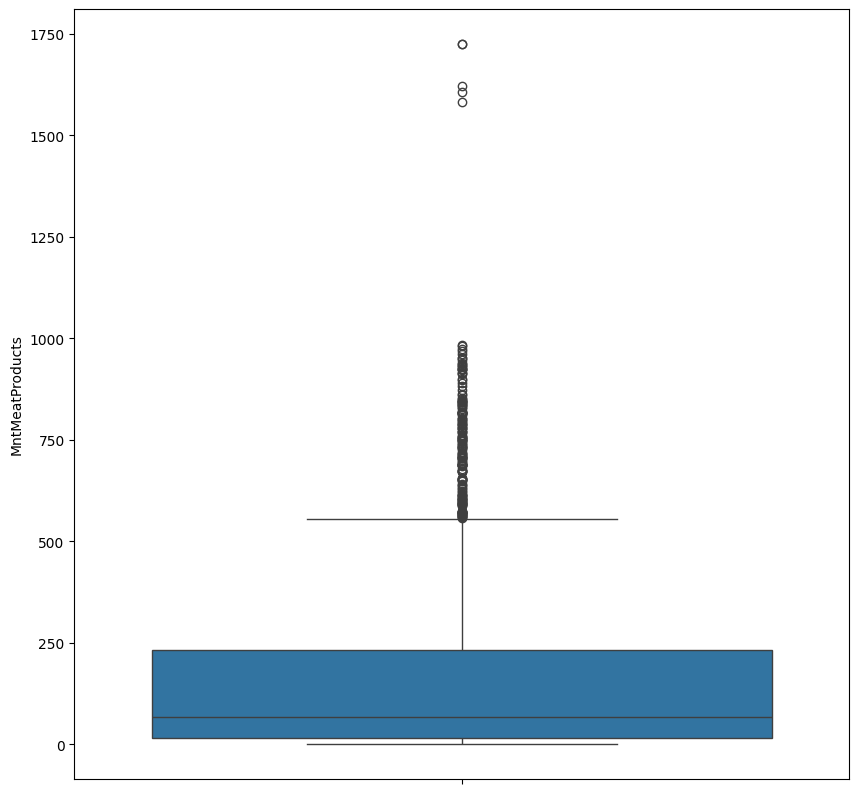

...

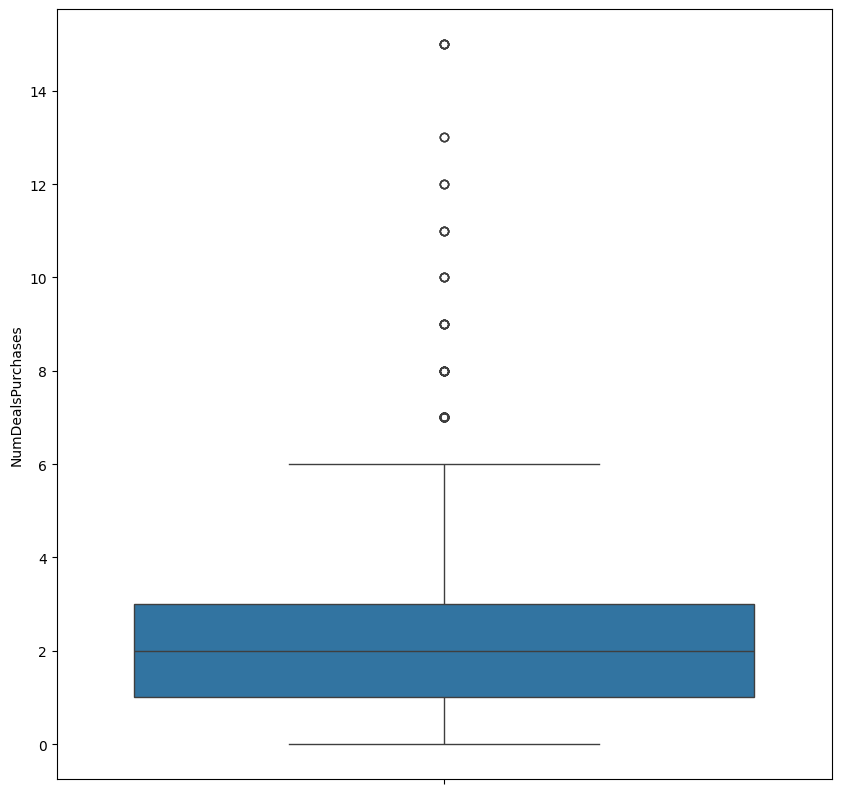

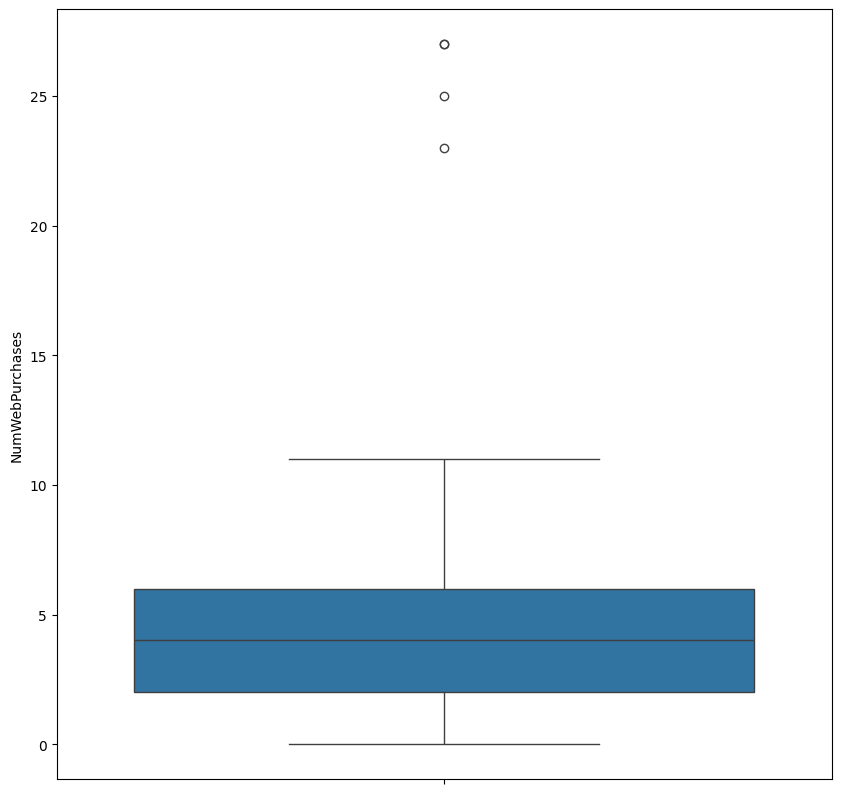

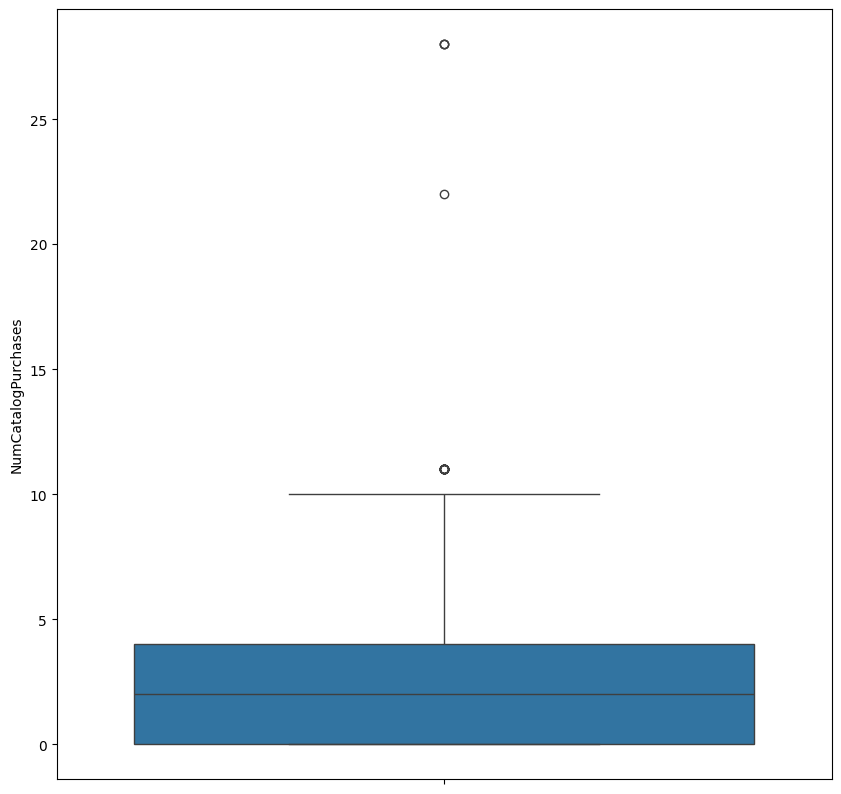

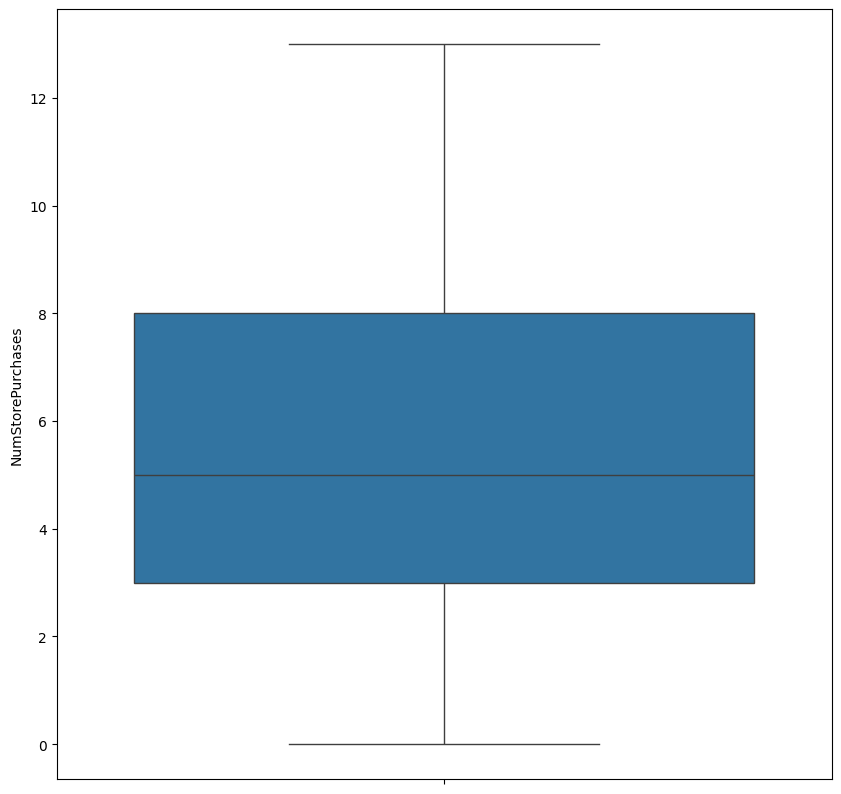

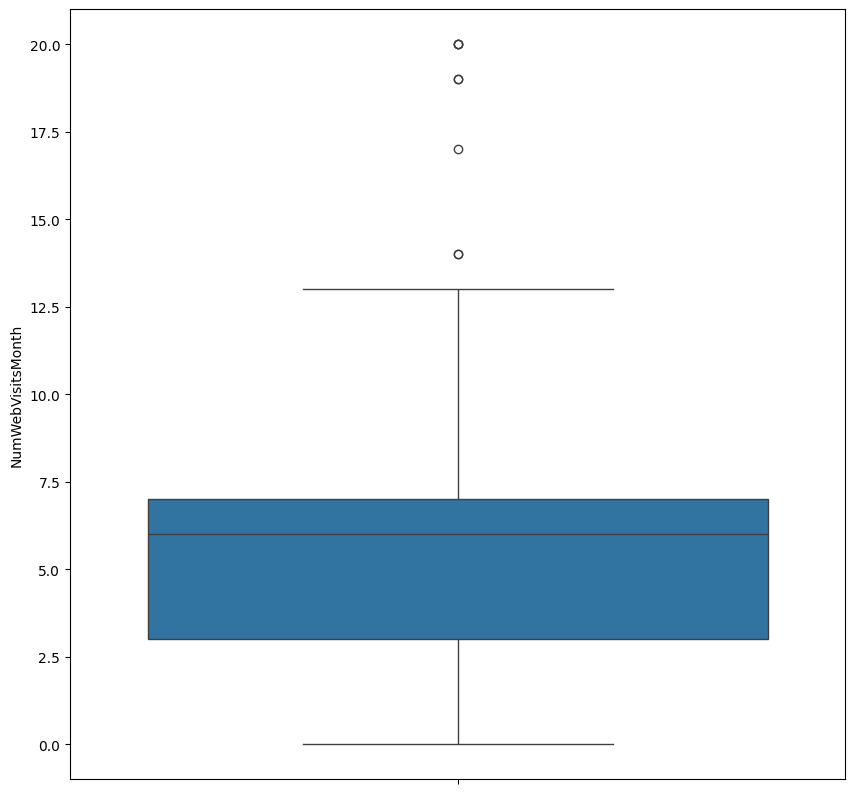

In [ ]:
for col in numeric_cols:
    plt.figure(figsize=(10, 10))
    sns.boxplot(data = df[numeric_cols], y = col)
    plt.show()


The high amount of outliers affects the visualization in the distributions. Considering that clustering methods: k-means and hirarchical clustering are sensible to distances, outliers will be removed. DBScan is also used as robust method.  

In [ ]:
df.shape

(2240, 28)

In [ ]:
from scipy import stats
import numpy as np

z_scores = np.abs(stats.zscore(df[numeric_cols]))
df_clean = df[(z_scores < 3).all(axis=1)]
df_clean.shape

(1980, 28)

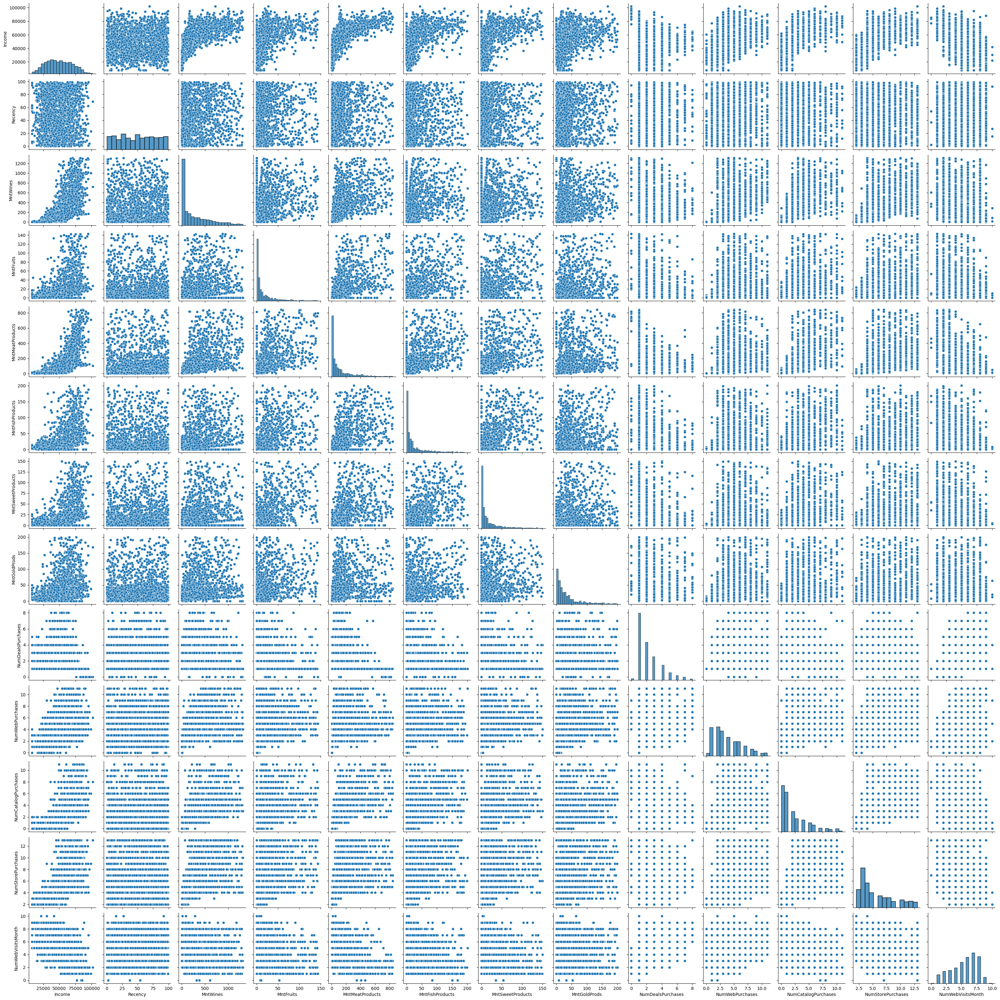

In [ ]:
sns.pairplot(df_clean[numeric_cols])
plt.show()

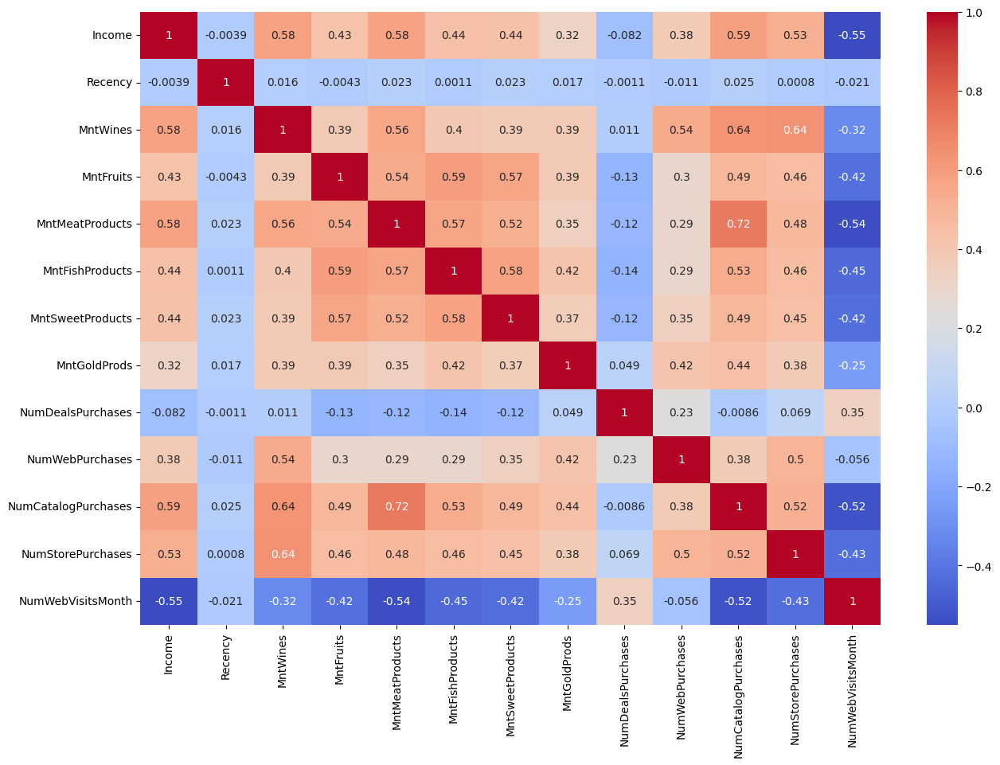

In [ ]:
fig = plt.figure(figsize=(15, 10))
sns.heatmap(df[numeric_cols].corr(), annot=True, cmap='coolwarm')
plt.show()

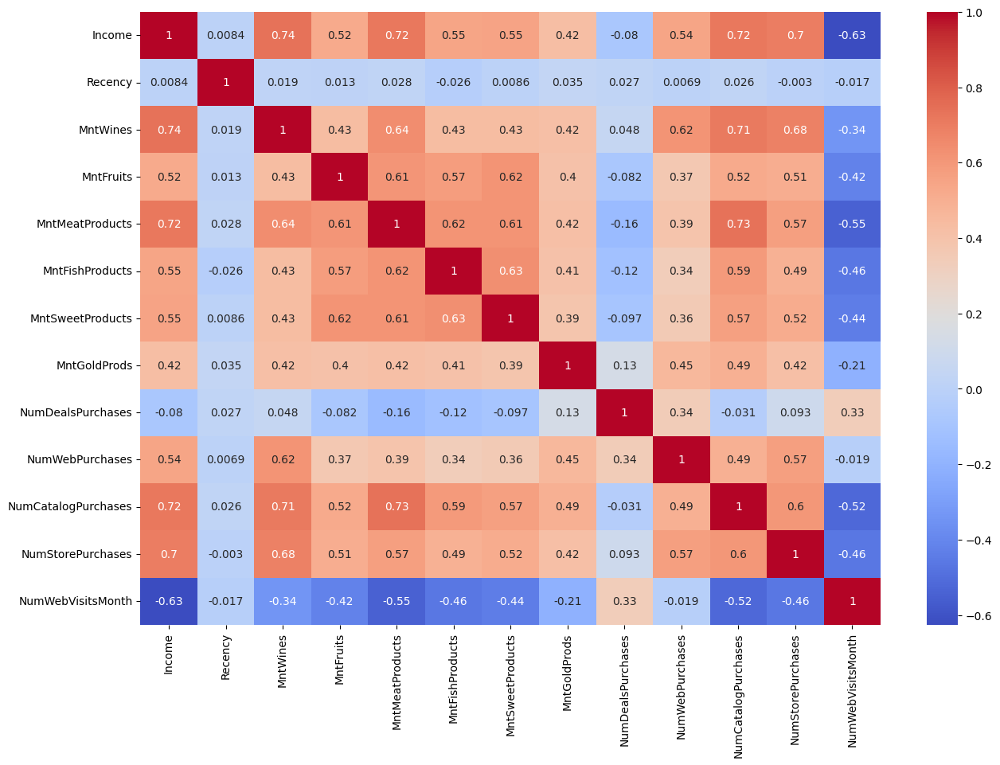

In [ ]:
fig = plt.figure(figsize=(15, 10))
sns.heatmap(df_clean[numeric_cols].corr(), annot=True, cmap='coolwarm')
plt.show()

# Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_clean[numeric_cols])
df_scaled = pd.DataFrame(df_scaled, columns=numeric_cols)
df_scaled.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
0,0.454812,0.299646,1.136401,2.302100,2.289735,3.417273,2.203763,1.174892,0.447749,1.571386,2.988382,-0.496524,0.685642
1,-0.150212,-0.390157,-0.817256,-0.632749,-0.696956,-0.634944,-0.632250,-0.725290,-0.184142,-1.113452,-0.503845,-1.126324,-0.225174
2,1.146071,-0.804038,0.482051,0.986478,-0.027716,1.963242,0.019707,0.108936,-0.816033,1.571386,-0.115820,1.392876,-0.680582
3,-1.160707,-0.804038,-0.817256,-0.531547,-0.619523,-0.444251,-0.567054,-0.748463,-0.184142,-0.729904,-0.891870,-0.496524,0.230234
4,0.462764,1.541291,-0.310056,0.784074,-0.077494,0.413865,0.215294,-0.516733,1.711530,0.420741,0.272206,0.133276,-0.225174


# PCA

In [ ]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(df_scaled)
pca_df = pca.transform(df_scaled)
pca_df = pd.DataFrame(pca_df)
pca_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,5.001173,0.474481,0.151200,2.739771,-0.249370,1.586982,-2.302535,0.994206,-0.486824,0.172196,-0.643252,-0.210897,0.017648
1,-2.034727,-0.913917,-0.295366,-0.318857,0.091626,-0.489735,-0.228164,0.273960,0.107989,0.415484,-0.093205,0.322120,0.261246
2,2.419923,-0.178870,-1.010471,-0.050880,-0.460630,0.407571,0.675034,-1.330848,-1.663872,0.546808,-0.008817,0.018797,-0.000623
3,-2.214397,-0.502557,-0.787248,0.113844,-0.188246,-0.128507,0.076387,-0.051222,-0.097340,-0.227312,0.032975,-0.216273,-0.332372
4,0.602879,0.951393,1.467937,0.480353,-1.350196,-0.894784,-0.239016,0.392868,-0.365337,0.520559,-0.202284,0.074883,0.316073


Text(0, 0.5, 'Cumulative explained variance')

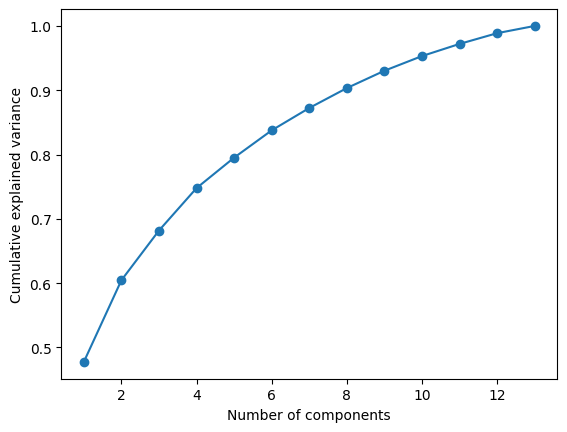

In [ ]:
from itertools import accumulate
var = pca.explained_variance_ratio_
accumulated_var = list(accumulate(var))
plt.plot(range(1, len(var)+1), accumulated_var, marker='o')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

In [ ]:
pca_data = pd.DataFrame(pca_df)
pca_data = pca_data[[0, 1, 2, 3]]
display(pca_data.head())

,0,1,2,3
0,5.001173,0.474481,0.151200,2.739771
1,-2.034727,-0.913917,-0.295366,-0.318857
2,2.419923,-0.178870,-1.010471,-0.050880
3,-2.214397,-0.502557,-0.787248,0.113844
4,0.602879,0.951393,1.467937,0.480353


In [ ]:
pca_components = pd.DataFrame(pca.components_, columns=numeric_cols, index=[f'PC{i+1}' for i in range(pca.n_components_)])
display(pca_components.iloc[:4])

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
PC1,0.349499,0.007467,0.317984,0.291230,0.339767,0.297593,0.298731,0.238052,-0.019793,0.247491,0.342443,0.318901,-0.247680
PC2,-0.022457,0.034070,0.183293,-0.093642,-0.134880,-0.146363,-0.121285,0.225998,0.644813,0.485872,0.005999,0.137558,0.423976
PC3,-0.002116,0.993692,-0.002210,-0.002500,0.029649,-0.059453,-0.013764,0.040162,-0.002044,-0.046743,0.023571,-0.036064,-0.047955
PC4,-0.317703,0.017370,-0.397419,0.416454,-0.029919,0.372046,0.403686,0.351955,0.136164,-0.067792,-0.120138,-0.219249,0.235795


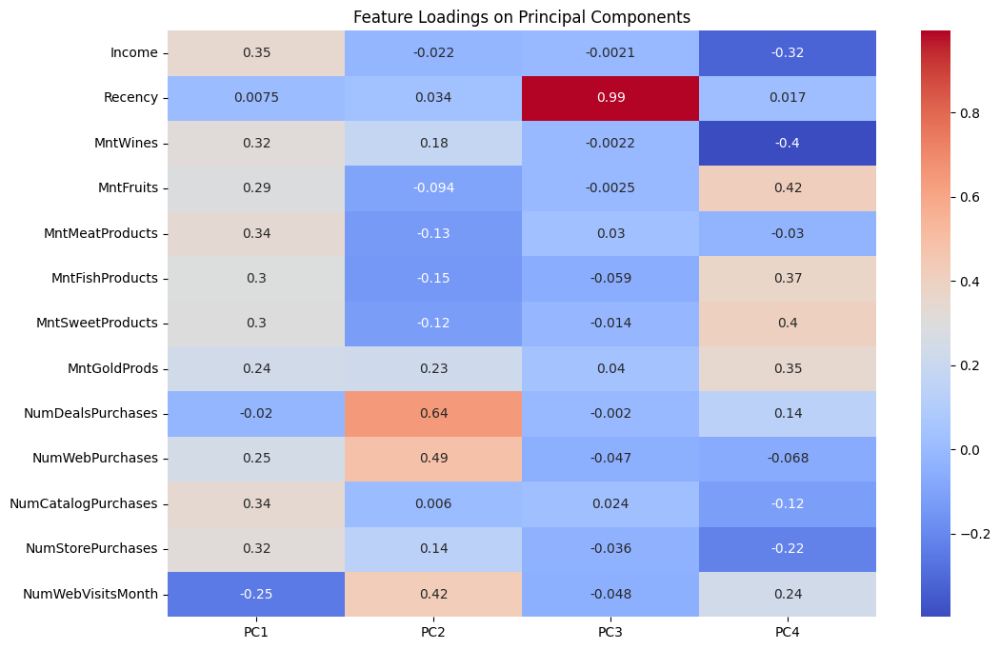

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(pca_components.iloc[:4].T, annot=True, cmap='coolwarm')
plt.title('Feature Loadings on Principal Components')
plt.show()

# Clustering


In [ ]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage

# K-means

## PCA

In [ ]:
Sum_of_squared_distances = []
silhouette_scores = []
K = range(2,15)
for k in K:
    km = KMeans(n_clusters=k, init='k-means++', max_iter=300)
    y = km.fit_predict(pca_data)
    Sum_of_squared_distances.append(km.inertia_)
    silhouette_scores.append(silhouette_score(pca_data, y))

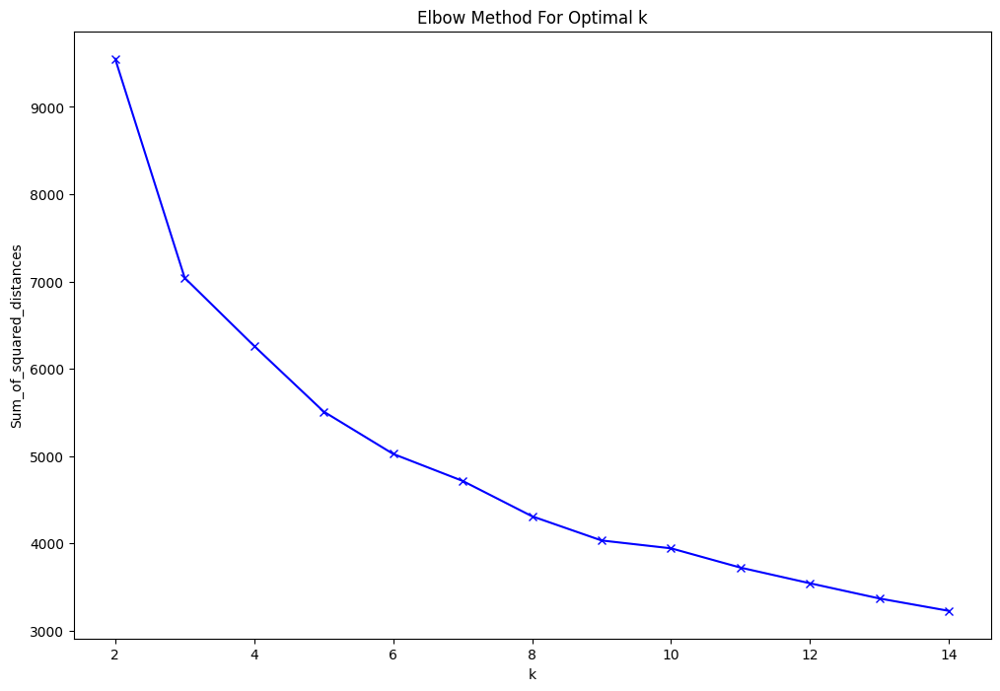

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

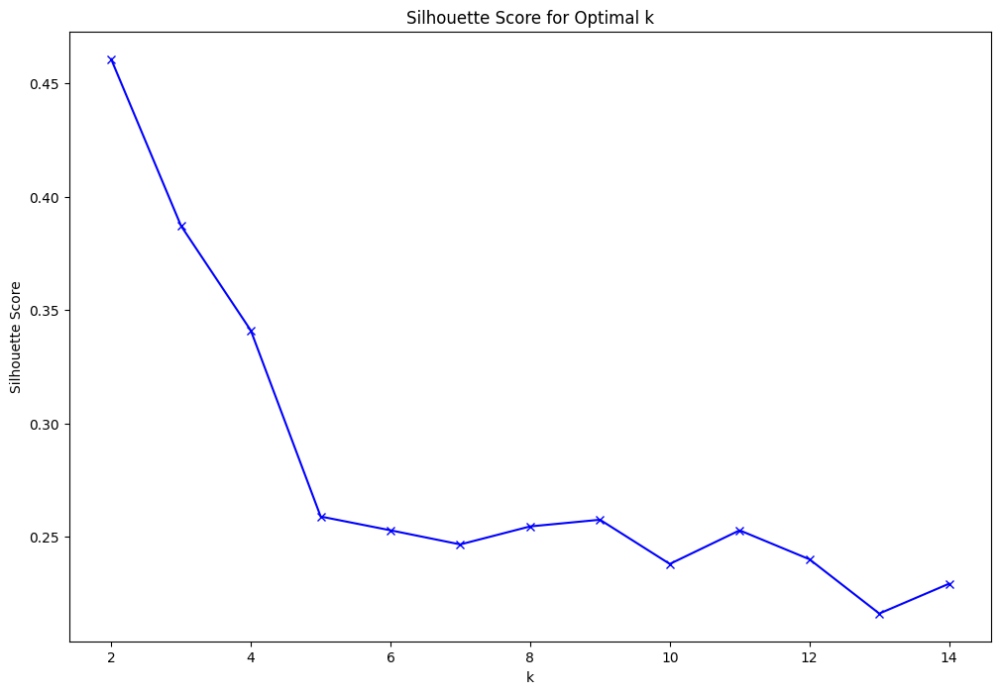

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(K, silhouette_scores, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal k')
plt.show()

In [ ]:
km = KMeans(n_clusters=3, init='k-means++', max_iter=300)
y = km.fit_predict(pca_data)
print(silhouette_score(pca_data, y))

0.38677494821943903


In [ ]:
df_clean = df_clean.copy()
df_clean['K_means_pca'] = y
df_scaled['K_means_pca'] = y

# No PCA

In [ ]:
Sum_of_squared_distances = []
silhouette_scores = []
K = range(2,15)
for k in K:
    km = KMeans(n_clusters=k, init='k-means++', max_iter=300)
    y = km.fit_predict(df_scaled[numeric_cols])
    Sum_of_squared_distances.append(km.inertia_)
    silhouette_scores.append(silhouette_score(pca_data, y))

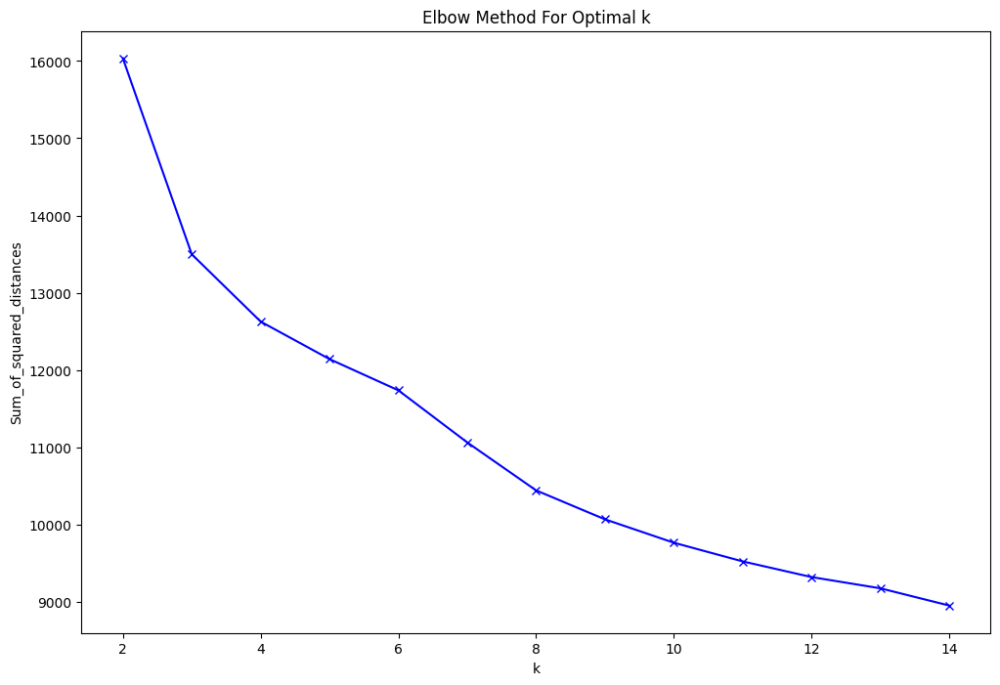

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

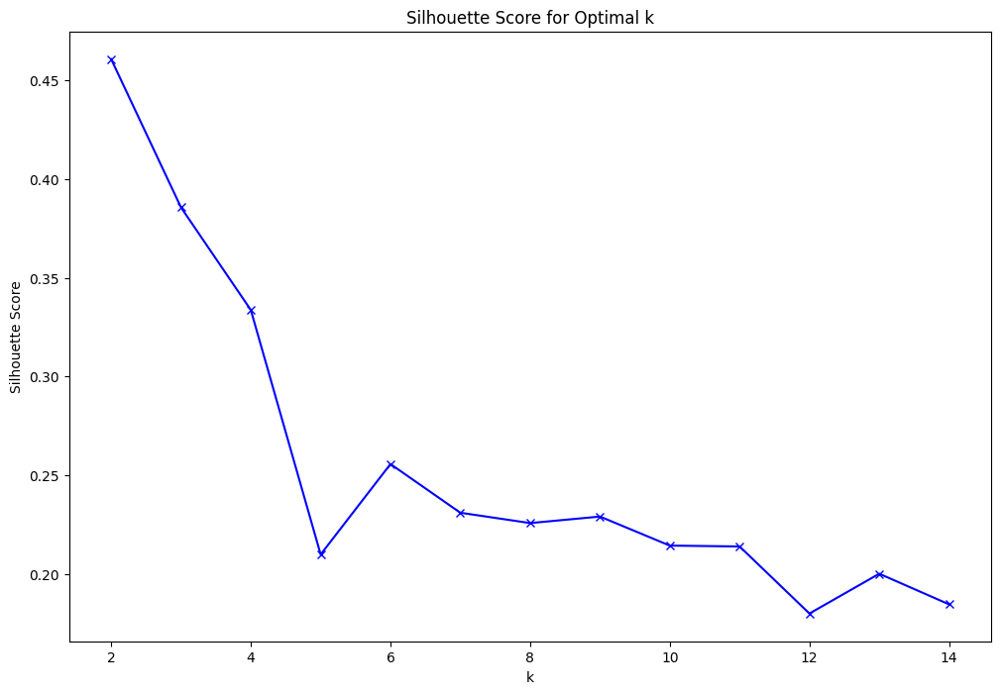

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(K, silhouette_scores, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal k')
plt.show()

In [ ]:
km = KMeans(n_clusters=3, init='k-means++', max_iter=300)
y = km.fit_predict(df_scaled)
print(silhouette_score(pca_data, y))

0.386701932948371


In [ ]:
df_clean = df_clean.copy()
df_clean['K_means_scaled'] = y
df_scaled['K_means_scaled'] = y

# Visualization

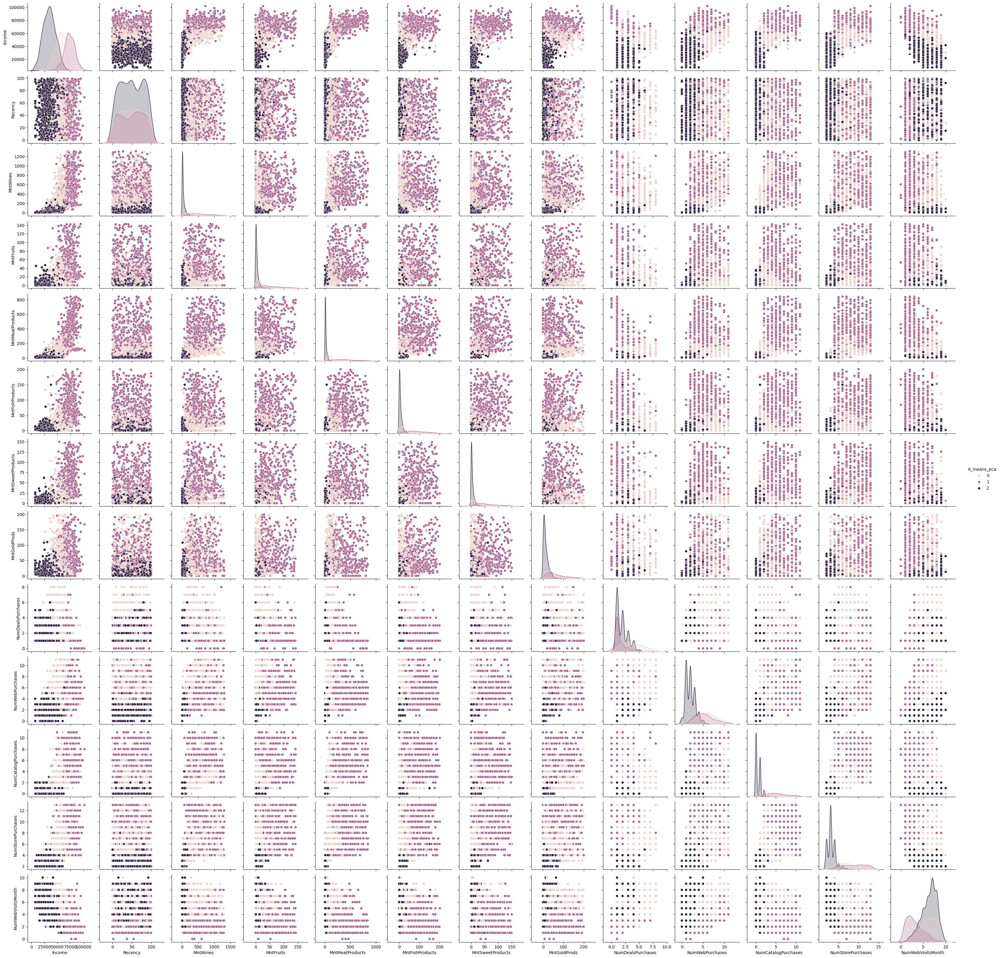

In [ ]:
numeric_cols_with_clusters = numeric_cols.tolist() + ['K_means_pca']
sns.pairplot(df_clean, hue='K_means_pca', vars=numeric_cols_with_clusters[:-1])
plt.show()

In [ ]:
cluster_means = df_clean[numeric_cols_with_clusters].groupby("K_means_pca").mean()
cluster_means


,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
K_means_pca,,,,,,,,,,,,,
0,55553.446785,48.738281,432.759766,16.033203,113.693359,21.167969,15.007812,53.777344,3.748047,6.201172,2.750000,7.162109,6.148438
1,72973.728002,49.662474,585.595388,55.350105,383.377358,82.222222,58.515723,68.218029,1.540881,5.381551,5.528302,8.800839,3.079665
2,34618.598655,49.439960,38.064581,4.548940,20.484359,6.704339,4.830474,13.903128,1.900101,2.004036,0.510595,3.205853,6.318870


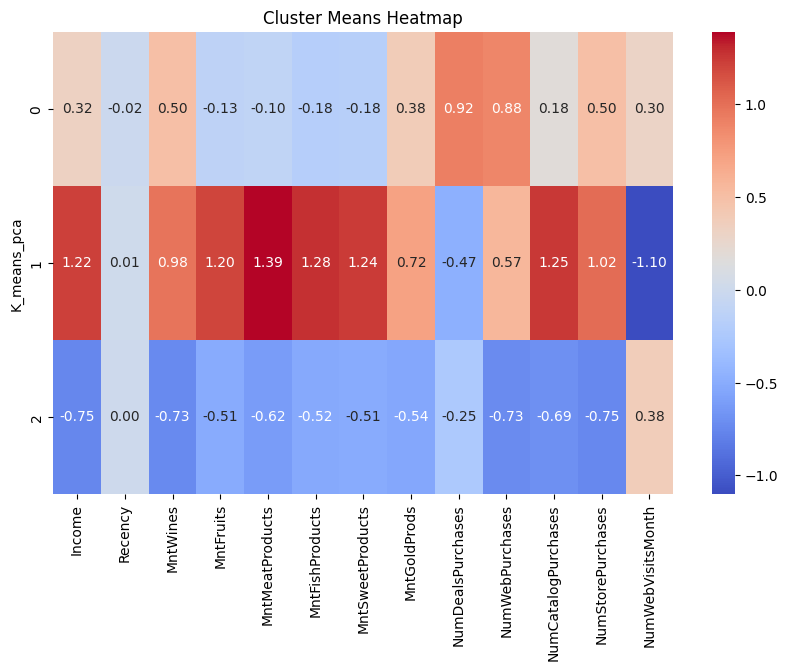

In [ ]:
cluster_means = df_scaled[numeric_cols_with_clusters].groupby("K_means_pca").mean()
plt.figure(figsize=(10,6))
sns.heatmap(cluster_means, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Cluster Means Heatmap")
plt.show()